# Preliminaries

In this notebook I will try to solve the task of image segmentation, using K-means and Expectation-Maximization algorithm.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.io import imread, imshow
from skimage.util import img_as_float32
from skimage.transform import resize

import sklearn.cluster

In [2]:
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower

In [3]:
# Mounting my Google Drive
# You can mount your Google Drive and upload any other picture
# (But better check out my cat first)
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [4]:
# Subtitute path to your picture 
img = imread("gdrive/My Drive/Colab Notebooks/Cats/EmbeddedCat.jpg")

In [5]:
img.shape

(1080, 1080, 3)

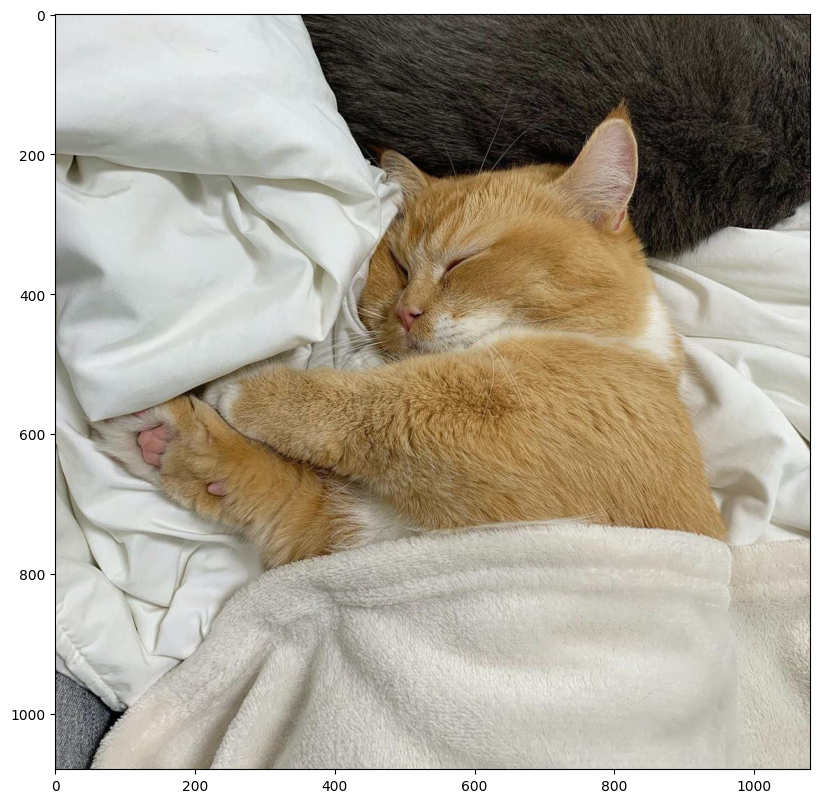

In [6]:
plt.imshow(img)

# K-means

## Using sklearn

Let's cluster the pixels

In [7]:
bag_of_pixels = img.reshape(img.shape[0] * img.shape[1], img.shape[2])

In [8]:
kmeans = sklearn.cluster.KMeans(n_clusters=2, random_state=0).fit(bag_of_pixels)

And substitute each pixel with it's cluster centroid

In [11]:
compressed_bag = np.empty_like(bag_of_pixels)

for cluster_num in range(kmeans.n_clusters):
    compressed_bag[kmeans.labels_ == cluster_num] = kmeans.cluster_centers_[cluster_num]

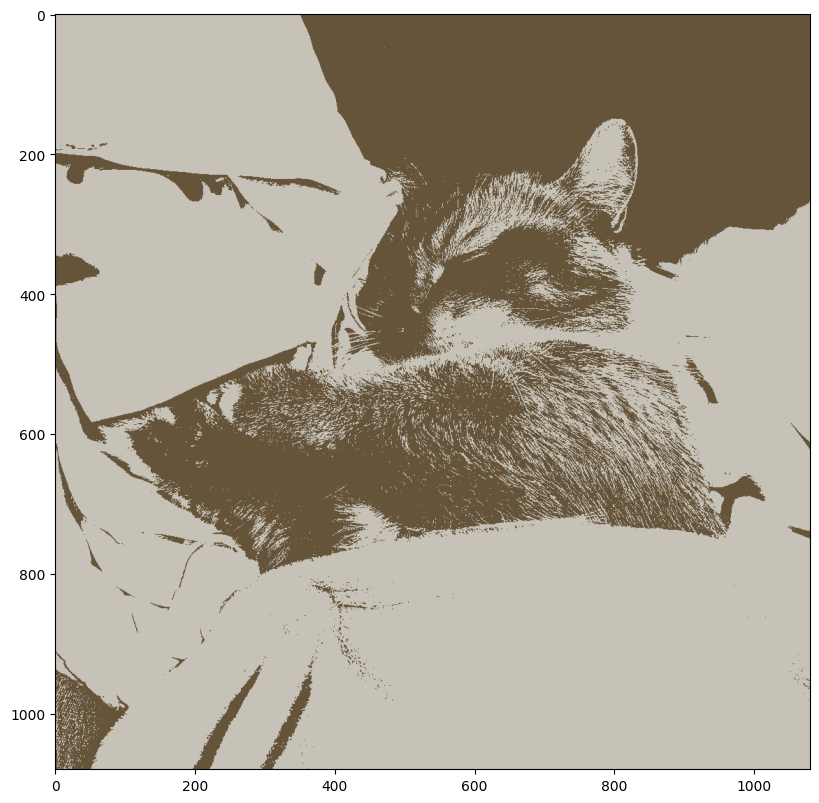

In [12]:
plt.imshow(compressed_bag.reshape(img.shape))

Basically, here we used only two colors. Therefore, it is possible to encode each pixel with one bit, spending just several bytes to write down, what colors have we used.

Let's combine the lines above in a function, which will take a picture and the amount of colors we want to keep, and return the repainted version.

In [13]:
def KmeansSegmentation(image, k):
    """
    Input:
    image -- an RGB (or BGR, or any three-channel) picture. 
             np.array of shape (height, width, depth)
    k     -- the amount of colors you want to keep a.k.a. the amount of clusters

    Output:
        Same picture, but using only k colors.
    """
    assert len(image.shape) == 3

    bag_of_pixels = img.reshape(img.shape[0] * img.shape[1], img.shape[2])

    kmeans = sklearn.cluster.KMeans(n_clusters=k, random_state=0).fit(bag_of_pixels)

    compressed_bag = np.empty_like(bag_of_pixels)

    for cluster_num in range(kmeans.n_clusters):
        compressed_bag[kmeans.labels_ == cluster_num] = kmeans.cluster_centers_[cluster_num]

    return compressed_bag.reshape(image.shape)

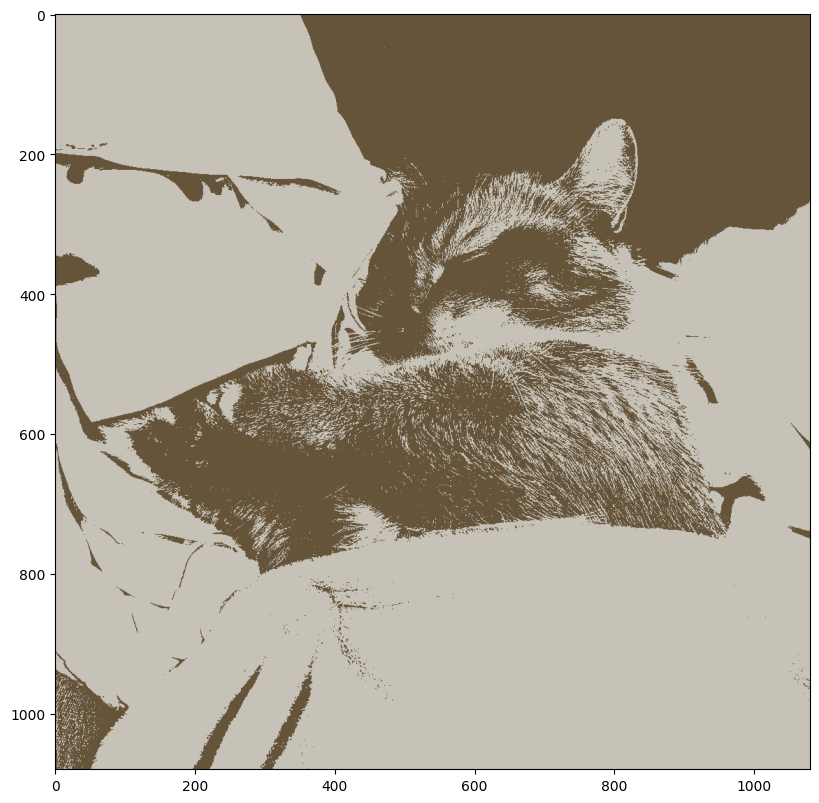

In [14]:
plt.imshow(KmeansSegmentation(img, 2))

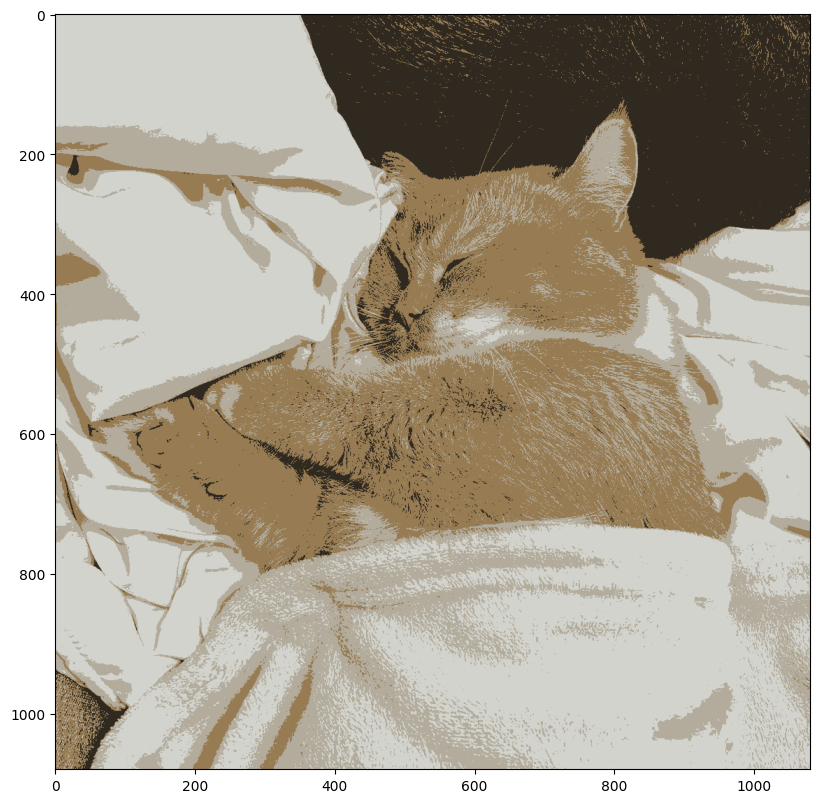

In [15]:
plt.imshow(KmeansSegmentation(img, 4))

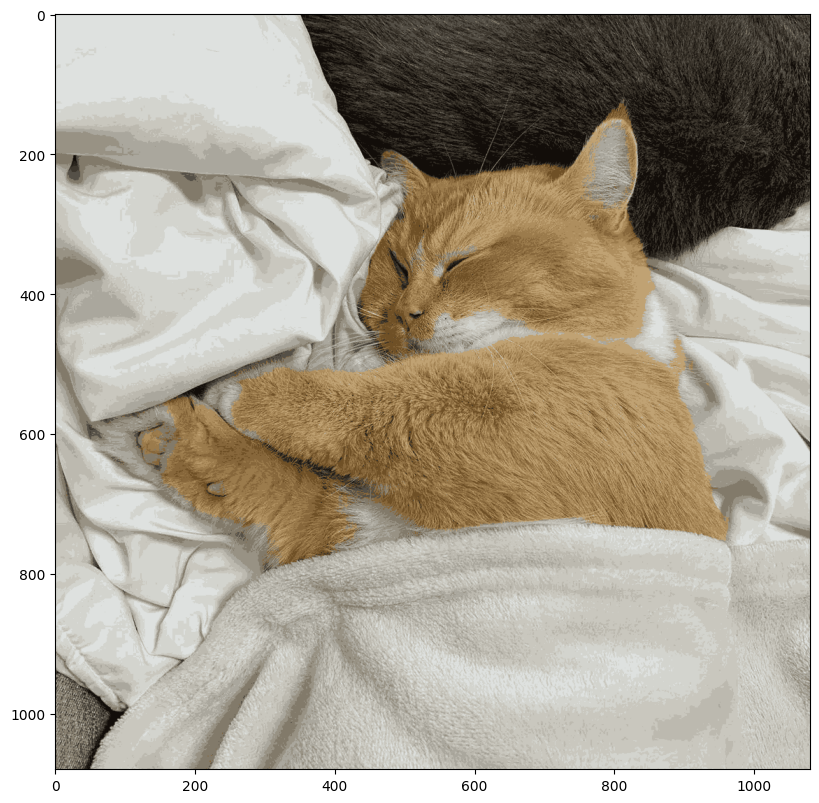

In [16]:
plt.imshow(KmeansSegmentation(img, 16))

We can see, that 16 colors is about enough to represent the original picture quite accurately.

## HandMade K-means

Let's implement K-means algorithm by hand.

In [17]:
def init_centroids(data, k):
    """
    k-means++ initialization.
    Input:
    data  -- np.array of shape (N, d), where N is the amount of objects,
                    and each object is represented as a vector of length d.
    k     -- The amount of clusters.
    
    Output:
    centroids -- Initial centoids. List of np.arrays of shape (d, )
    """
    np.random.seed(0)

    centroids = [data[0]]

    for j in range(1, k):
        distances = np.empty(shape = (data.shape[0], j))

        for i in range(j):
            distances[:, i] = np.sum((data - centroids[i])**2, axis = 1)
        
        min_dists = np.min(distances, axis = 1)

        grid = min_dists.cumsum() / min_dists.sum()
        sample = np.random.random()
        
        # Summing bool values. 
        # The array is sorted, and the amount of 'False' 
        # is equal to the index of the first index greater or equal than sample
        next_centroid = (grid < sample).sum()
        centroids.append(data[next_centroid])

    return centroids

In [18]:
def Kmeans(data, k, max_iter = 300, verbose = False):
    """
    Performs k-means clustering of input data.
    Uses k-means++ initialization.

    Inputs:
        data     -- np.array of shape (N, d), where N is the amount of objects,
                    and each object is represented as a vector of length d.
        k        -- The amount of clusters.
        max_iter -- The maximum amount of iterations.
        verbose  -- If turned on, prints the value of squared error on each step
                    of k-means clustering.
    
    Outputs:
        labels    -- np.array of shape (N,), where labels[i] contains 
                     the number of cluster of i-th object.
        centroids -- List of k np.arrays of shape (1, d). 
                     Centroids of corresponding clusters.
        se        -- Squared error. Sum of squares of distances from each point 
                     to it's cluster.
    """ 

    centroids = init_centroids(data, k)

    prev_se = None

    distances = np.empty(shape = (data.shape[0], k))
    labels = np.empty(shape = (data.shape[0],))

    for step in range(max_iter):

        # Update distances to centroids
        for i in range(k):
            distances[:, i] = np.sum((data - centroids[i])**2, axis = 1)

        # Reassign each point to closest centroid
        labels = np.argmin(distances, axis = 1)

        # Compute squared error
        se = np.sum(distances.min(axis = 1))
        
        if verbose:
            print(se)
        
        # If nothing changed, we have converged
        if prev_se == se:
            break

        prev_se = se

        # Update centroids
        for i in range(k):
            centroids[i] = np.mean(data[labels == i], axis = 0)[None, :]
        
    return labels, centroids, se

In [19]:
def HandKmeansSegmentation(image, k, verbose = False):
    """
    Performs segmentation via k-means clustering of pixels and consequent
    substitution of every pixel with its cluster centroid.

    Inputs:
        image   -- np.array such that len(image.shape) == 3.
        k       -- The amount of colors you want to keep.
        verbose -- If turned on, prints the value of squared error on each step
                   of k-means clustering.
    """
    assert len(image.shape) == 3

    bag_of_pixels = img.reshape(img.shape[0] * img.shape[1], img.shape[2])

    labels, centroids, _ = Kmeans(bag_of_pixels, k)

    compressed_bag = np.empty_like(bag_of_pixels)

    for i in range(k):
        compressed_bag[labels == i] = centroids[i]

    return compressed_bag.reshape(image.shape)

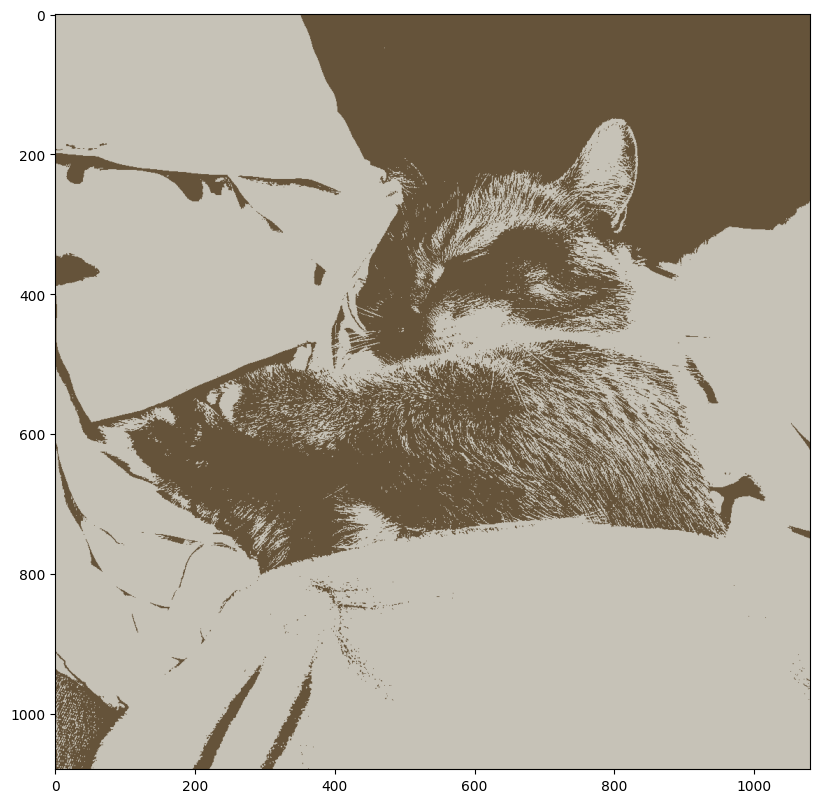

In [20]:
plt.imshow(HandKmeansSegmentation(img, 2))

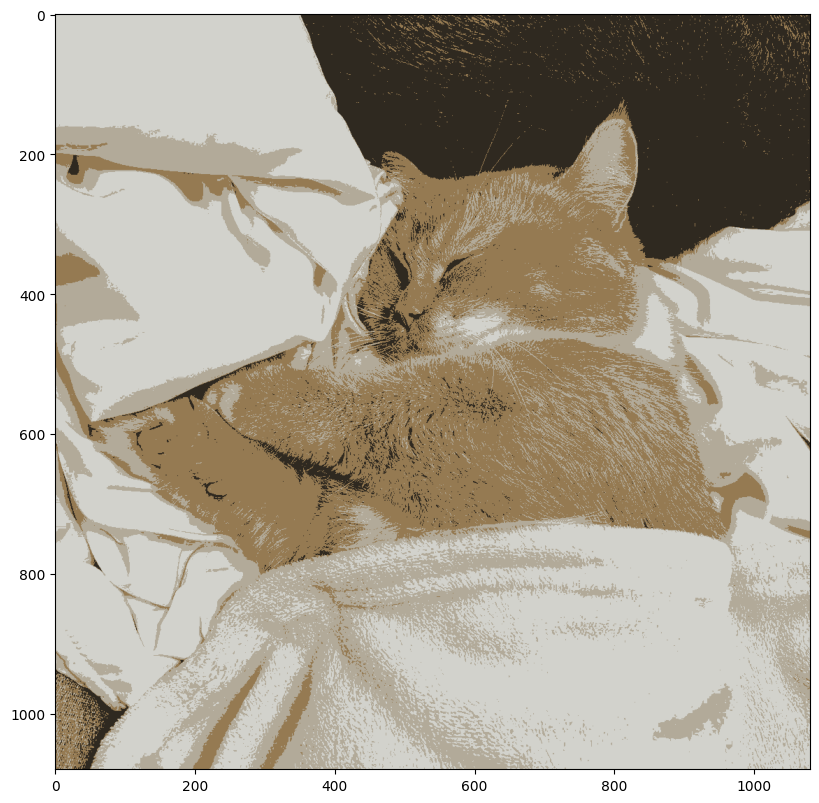

In [21]:
plt.imshow(HandKmeansSegmentation(img, 4))

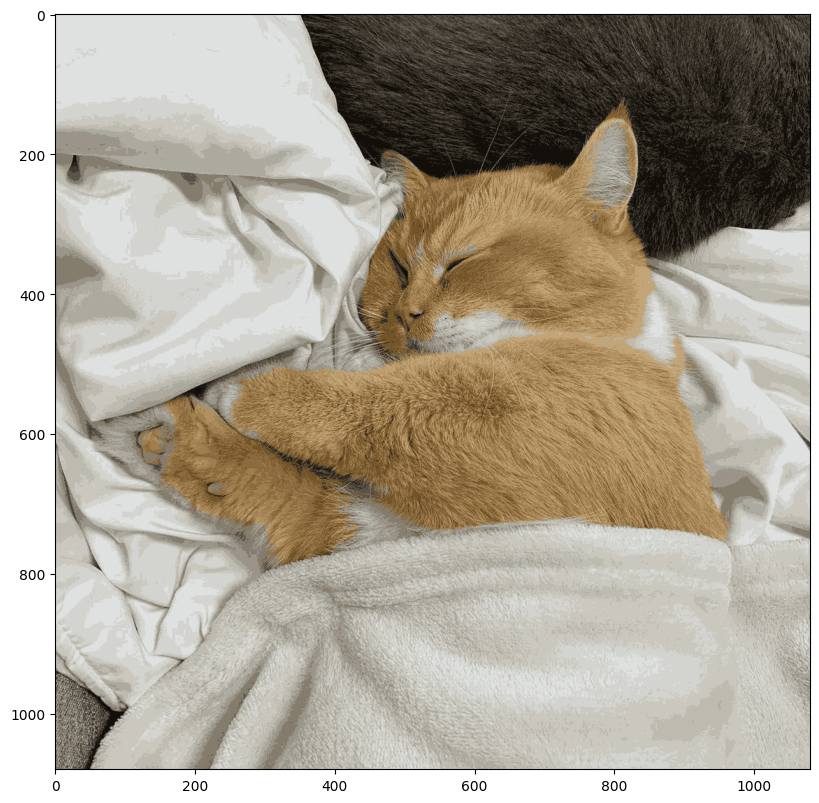

In [22]:
plt.imshow(HandKmeansSegmentation(img, 16))

## Speed comparison

CPU times: user 2.96 s, sys: 48.7 ms, total: 3.01 s
Wall time: 3.02 s


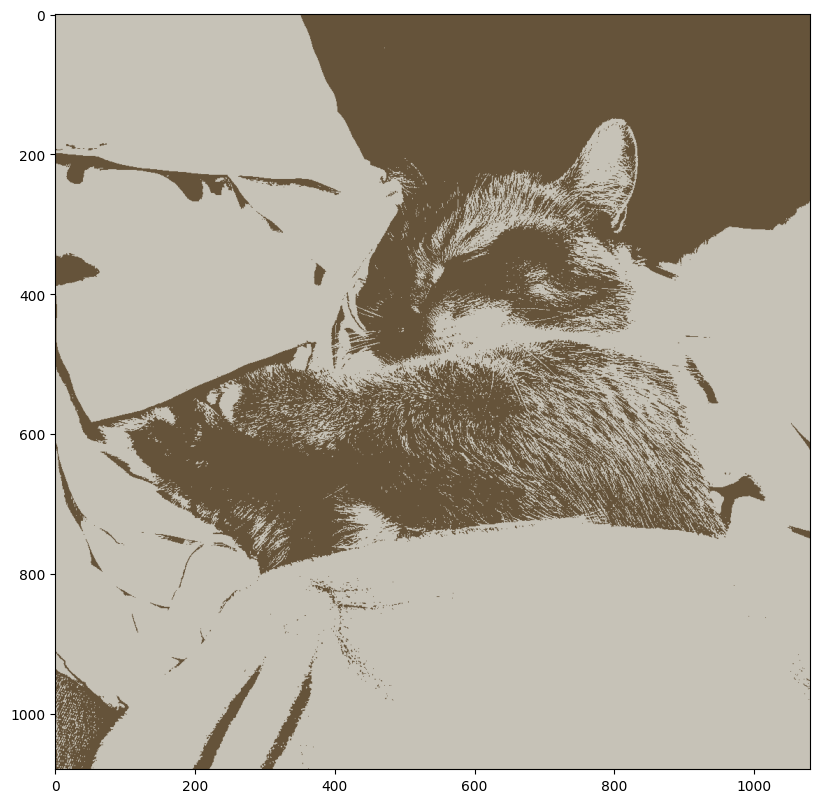

In [23]:
%%time
plt.imshow(HandKmeansSegmentation(img, 2))

CPU times: user 5.52 s, sys: 1.28 s, total: 6.8 s
Wall time: 5.4 s


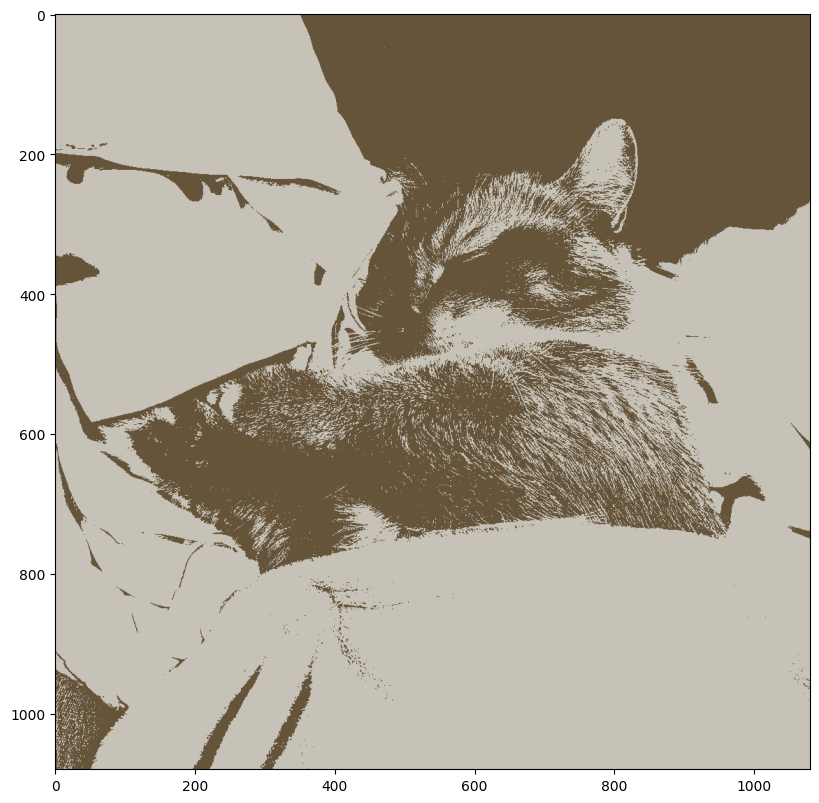

In [24]:
%%time
plt.imshow(KmeansSegmentation(img, 2))

CPU times: user 6.4 s, sys: 59.3 ms, total: 6.46 s
Wall time: 6.49 s


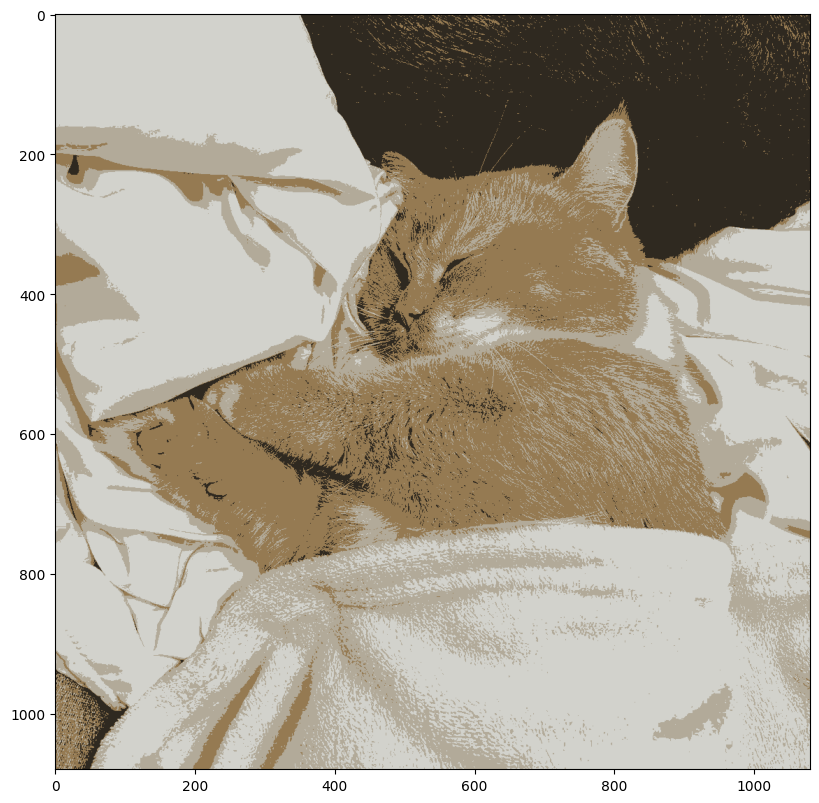

In [25]:
%%time
plt.imshow(HandKmeansSegmentation(img, 4))

CPU times: user 13 s, sys: 2.17 s, total: 15.2 s
Wall time: 12.7 s


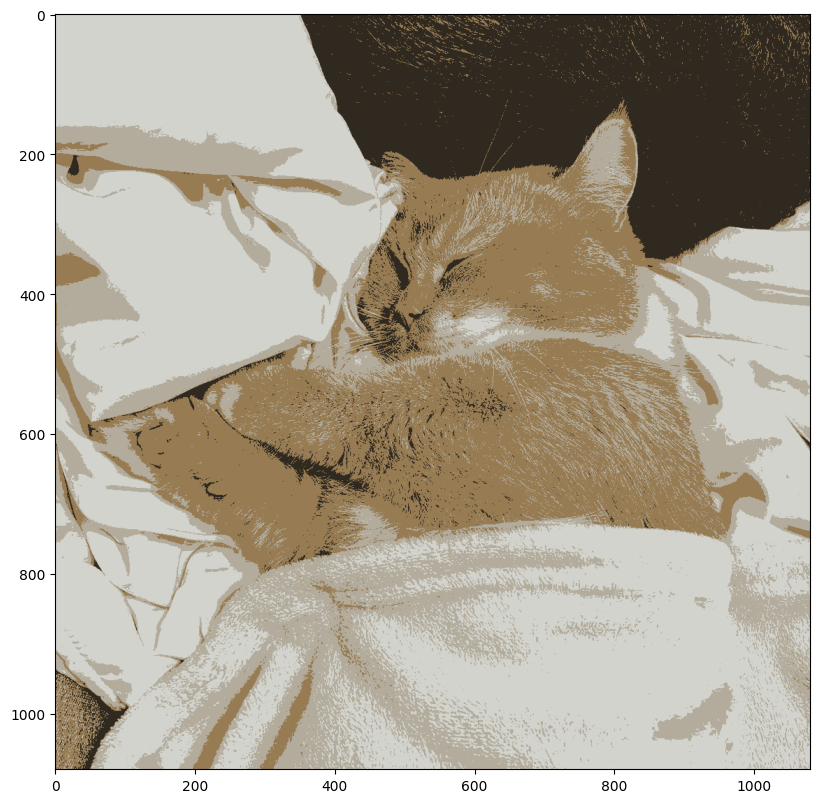

In [26]:
%%time
plt.imshow(KmeansSegmentation(img, 4))

CPU times: user 1min 58s, sys: 466 ms, total: 1min 59s
Wall time: 1min 59s


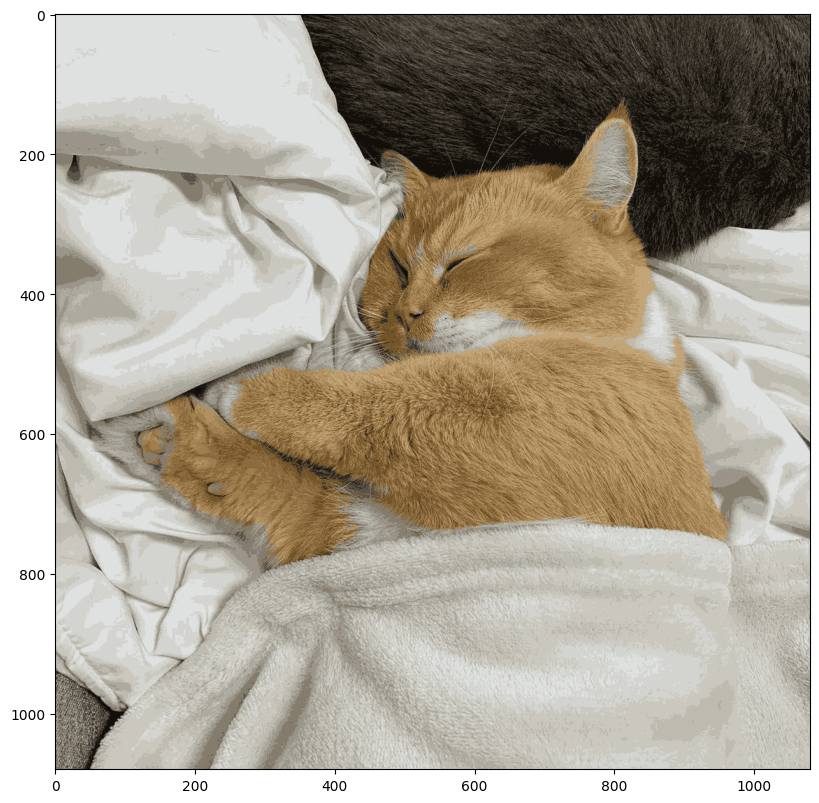

In [27]:
%%time
plt.imshow(HandKmeansSegmentation(img, 16))

CPU times: user 59.3 s, sys: 8.54 s, total: 1min 7s
Wall time: 57.2 s


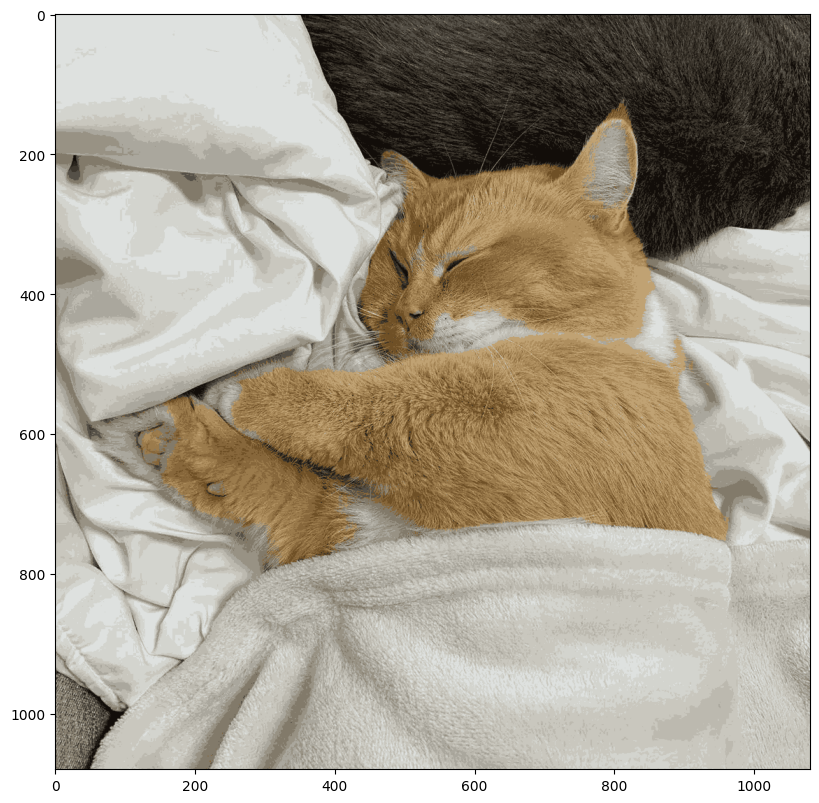

In [28]:
%%time
plt.imshow(KmeansSegmentation(img, 16))

# Expectation-Maximization Algorithm

## Handwaving
Image segmentation can be reduced to pixels clustering.

Clustering, in its term, can be viewed as a part of more general task - mixture identifying. Imagine, that we have a distribution, and it's probability density function be written as follows:

$$
   p(x \: | \: \theta) = \pi_1 \, p_1(x \: | \: \theta) + \pi_2 \, p_2(x \: | \: \theta) + \ldots + \pi_k \, p_k(x \: | \: \theta)
$$

Such situations usually arise exactly in the case when there are several clusters in the data, each with it's own pdf. If we know parameters $\pi = (\pi_1, \ldots, \pi_k)$ and $\theta$, we will be able to find the probability $p(Z_i = c \: | \: X_i, \theta, \pi)$. 
And it's essentially the probability of the pixel $X_i$ being 
a member of $c$-th cluster.

Expectation-maximization algorithm is a method, used to find maximum likelihood
(or maximum a posteriori) estimates in statistical models with latent variables.
So, in order to apply EMA to our task, we should come up with a suitable statistical model.



## Model

We will treat each pixel as a random variable $X_i$. We suppose, that for each pixel there is a latent variable $Z_i$, which defines, from which cluster $X_i$ came from. Namely,
$$
    Z = \begin{cases}
        1, \; \text{ with probability } \pi_1 \\
        \vdots \\
        k, \; \text{ with probability } \pi_k
    \end{cases}
$$

We are interested in finding the posterior probability 
$$
    p(Z_i = c \: | \: X_i, \theta, \pi)
$$
It could be rewritten, using the Bayes theorem
$$
    p(Z_i = c \: | \: X_i, \theta, \pi) =
    \frac{p(X_i \: | \: Z_i = c, \theta, \pi) P(Z_i = c \: | \: \theta, \pi)}{P(X_i)} = 
    \frac{p(X_i \: | \: Z_i = c, \theta, \pi) P(Z_i = c \: | \: \theta, \pi)}
    {\sum_{r = 1}^k p(X_i \: | \: Z_i = r, \theta, \pi) P(Z_i = r \: | \: \theta, \pi)}
$$

To define the model, we have to choose the distributions $P(X \: | \: Z = c, \theta, \pi), \; P(Z \: | \: \theta, \pi)$. Actually, we have already chosen the distribution of $Z$, and it depends only on $\pi$. What about the $P(X \: | \: Z = c, \theta, \pi)$?

Here in statistics, when we don't know what to choose, we take normal distribution. If somebody asks, we can always refer to the fact, that normal distribution has the largest differential entropy among all distributions over real numbers with fixed mean and variance, and hence represents the 'worst' possible situaion, where we don't know anything about the distribution. While the person who asked digests this information, we'll have time to estimate the parameters.

So, we suppose, that pixels in each cluster are normally distributed around some mean $\mu = (\mu_1, \mu_2, \mu_3)$ with covariance matrix $\Sigma = \left( \begin{matrix} 
\sigma_{11} & \sigma_{12} & \sigma_{13} \\ 
\sigma_{21} & \sigma_{22} & \sigma_{23} \\ 
\sigma_{31} & \sigma_{32} & \sigma_{33} 
\end{matrix} \right) $.
Then $ P(X_i \: | \: Z_i = c, \theta, \pi) \sim \mathcal{N}(\mu_c, \Sigma_c)$, where $c$ is the number of cluster.

This is called _Gaussian Mixture Model_.

## Estimation
Our model is fully defined. Now we have to find the values of parameters $\theta = (\mu_1, \ldots, \mu_k, \Sigma_1, \ldots, \Sigma_k)$ and $\pi = (\pi_1, \ldots, \pi_k)$. _Actually, $\pi$ is also a parameter, so hereafter I will write $\theta$, meaning the whole set $(\mu_1, \ldots, \mu_k, \Sigma_1, \ldots, \Sigma_k, \pi_1, \ldots, \pi_k)$._

There are numerous methods to obtain such estimates. EM algorithm is one of them.

Let's recall how it works. Our goal is to maximize log-likelihood $\log L(X, \theta) = \log p(X \; | \; \theta)$. _Here $X = (X_1, \ldots, X_N)$ is the whole dataset_. But it is hard to maximize it directly. So, we do some magic:

$$
\log p(X \; | \; \theta) = 
\int\limits_{\mathcal{Z}} q(Z) \log p(X \; | \; \theta) \, dZ = \\
\int\limits_{\mathcal{Z}} q(Z) \log \frac{p(X, Z \; | \; \theta)}{p(Z \; | \; X, \theta)} \, dZ = \\
\int\limits_{\mathcal{Z}} q(Z) \log \left( \frac{p(X, Z \; | \; \theta)}{q(Z)} \frac{q(Z)}{p(Z \; | \; X, \theta)} \right) \, dZ = \\
\underbrace{\mathbb{E}_q \log \frac{p(X, Z \; | \; \theta)}{q(Z)}}_{\mathcal{L}(q, \theta)} \; 
\underbrace{-\mathbb{E}_q \log \frac{q(Z)}{p(Z \; | \; X, \theta)}}_{\operatorname{KL} \left(q(Z) \: || \: p(Z \; | \; X, \theta) \right)}
$$

Here $q(Z)$ is an arbitrary distribution over latent variables (only contraint - it's pdf mustn't vanish to zero).
So 

$$
\log p(X \; | \; \theta) = \mathcal{L}(q, \theta) + \operatorname{KL} \left(q(Z) \: || \: p(Z \; | \; X, \theta) \right)
$$

The first term is called _Evidence Lower Bound_ (or ELBO), the second &mdash; _Kullback-Leibler divergence_.

Imagine, that we have some estimate $\theta^k$.
Then, of course

$$
\log p(X \; | \; \theta^k) = \mathcal{L}(q, \theta^k) + \operatorname{KL} \left(q(Z) \: || \: p(Z \; | \; X, \theta^k) \right)
$$

Kullback-Leibler divergence is nonnegative and turns zero only and if only $q = p$ almost everywhere. 

Let's set $q^{k+1}(Z) = p(Z \: | \: X, \theta)$.
Then 

$$
\log p(X \; | \; \theta^k) = \mathcal{L}(q^{k+1}, \theta^k)
$$

And here is the great thing: if we now maximize right side with respect to $\theta$, setting 

$$
\theta^{k+1} = \underset{\theta \in \Theta}{\arg \max} \, \mathcal{L}(q^{k+1}, \theta^{k+1}),
$$

we will inevitably increase log-likelyhood!

Indeed, we can write
$$
\log p(X \; | \; \theta^{k+1}) = \mathcal{L}(q, \theta^{k+1}) + \operatorname{KL} \left(q(Z) \: || \: p(Z \; | \; X, \theta^{k+1}) \right)
$$

But the KL-divergence is nonnegative, so
$$
\log p(X \; | \; \theta^{k+1}) \geqslant \mathcal{L}(q, \theta^{k+1}).
$$
So, instead of maximizing likelihood, we can maximize the ELBO. It turns out to be much easier. In case of Gaussian Mixture Model, which we are using right now, values of the parameters, which maximize ELBO, can be derived analytically.

Of course, all of the above can be applied to discrete latent variables, changing the integration over $\mathcal{Z}$ with summation.

## Algorithm
1. Initialize parameters somehow:
$$
\theta = \theta^0
$$
2. Until ~~you get bored~~ convergence:
  - E-step: Set 
  $$
  q^{k+1} = p(Z | X, \theta^k).$$ Thus KL-divergence will vahish to zero.
  - M-step: find $\theta^{k+1}$, which maximizes the ELBO:
  $$
  \theta^{k+1} = \underset{\theta \in \Theta}{\arg \max} \, \mathcal{L}(q^{k+1}, \theta^k).
  $$
3. Done.

## Implementation

In [32]:
import scipy.linalg as sla
from scipy.stats import multivariate_normal
from math import log

Library function for computing the logarithm of the multivariate normal pdf is rather slow, so I implement my version.

In [33]:
def logdet_triangle_mat(R):
    sign = 1
    res = 0
    for i in range(R.shape[0]):
        if R[i, i] < 0:
            res += log(-R[i,i])
            sign *= -1
        else:
            res += log(R[i,i])
    return sign * res

def compute_diagonal_of_product(A, B):
    return (A * B.T).sum(-1)

def my_multivariate_normal_logpdf(X, mu, sigma):
    '''
    Inputs:
    
    X     -- a set of points, np.array of shape (N, D)
    mu    -- location, np.array of shape (1, D)
    sigma -- covariance matrix, np.array of shape (D, D)
    
    Вывод
    ------
    logarithm of pdf at point x[i]. np.array of shape (N,).
    '''
    shifted_X = X - mu
    
    R, lower = sla.cho_factor(sigma)
    # Multiplied by 2, since sigma = R @ R.T, so log det sigma = 2 log det R
    logdet = 2 * logdet_triangle_mat(R)
    D = mu.size

    inversed_covariance_times_shifted_X = sla.cho_solve((R, lower), shifted_X.T)
    quadratic_term = compute_diagonal_of_product(shifted_X, inversed_covariance_times_shifted_X)
    
    return -0.5 * quadratic_term - 0.5 * (D * log(2 * np.pi) + logdet)

Sanity check:

In [34]:
mu = np.random.rand(5)
mat = np.random.rand(5, 5)
sigma = mat @ mat.T
sample = multivariate_normal.rvs(mean = mu, cov = sigma, size = 3)
sample.shape

(3, 5)

In [35]:
sample

array([[ 0.78123577,  0.55585426,  0.04915637,  1.28005782,  0.92071909],
       [ 1.49447103,  0.12963965,  0.84175095,  0.14063852,  0.16144733],
       [-0.00250541,  0.3811557 , -0.10534169,  0.85905419, -0.05438857]])

In [36]:
print(my_multivariate_normal_logpdf(sample, mu, sigma))
print(multivariate_normal.logpdf(sample, mu, sigma))

[-2.37353207 -4.82071209 -2.38590386]
[-2.37353207 -4.82071209 -2.38590386]


### E-step

In [160]:
from scipy.special import softmax

def E_step(X, pi, mu, sigma):
    """
    Takes the dataset and current parameter estimates
    and computes posterior distribution over latent variables.

    Inputs:
    X        -- Dataset. np.array of shape (N, d), where N is the amount of 
                objects and each object is represented as a vector of length d.
    theta_k  -- Current parameter estimates. Tuple of (mu, sigma, pi), where
                mu is a (C, d) np.array, containing locations of gaussians, 
                sigma is a (C, d, d) np.array, containing covariance matrices 
                and pi is a (C,) np.array, containing the weight of 
                corresponding components. 'C' is the amount of components
    Outputs:
    z_given_x -- np.array of shape (C, N), where z_given_x[c, i] equals to
                 p(Z_i = c | X_i, theta_k)
    """

    #print("Mu =", mu, "\nSigma =", sigma, "\nPi =", pi)
    N = X.shape[0]
    C = mu.shape[0]

    x_given_z = np.empty(shape = (C, N))

    for i in range(C):
        x_given_z[i] = my_multivariate_normal_logpdf(X, mu[i], sigma[i])

    #print("X_given_z", x_given_z.shape, x_given_z)

    # trick to avoid numerical errors
    x_given_z -= x_given_z.max(axis = 0).reshape(1, N)
    
    x_given_z += np.log(pi).reshape(C,1)
    
    #x_given_z = np.exp(x_given_z)

    #normalization_constants = np.sum(pi.reshape(C, 1) * x_given_z, axis = 1)
    
    #print("X_given_z", x_given_z.shape, x_given_z)

    #print("Norm_consts", normalization_constants.shape, normalization_constants)

    #z_given_x = pi.reshape(C, 1) * x_given_z / normalization_constants.reshape(C, 1)
    z_given_x = softmax(x_given_z, axis = 0)

    #print("Z_given_x", z_given_x.shape, z_given_x)

    #print("Less than zero: ", np.sum(z_given_x <= 0))
    #print(z_given_x[z_given_x <= 0])

    assert (z_given_x >= 0).all(), "Negative weights"
    assert np.allclose(np.sum(z_given_x, axis=0), 1), \
           "Weights don't sum up to one"

    return z_given_x


### M-step

In [229]:
def M_step(X, posterior):
    """
    Performs M-step on GMM model.

    Input:
    X         -- Dataset. np.array of shape (N, d), where N is the amount of 
                 objects and each object is represented as a vector of length d.
    posterior -- Posterior distribution over latent variables given the dataset
                 and current parameter estimates. np.array of shape (C, N).
    
    Output:
    pi        -- Weights of the mixture. np.array of shape (C, )
    mu        -- Means. (C, d)
    sigma     -- Covariance matrices. (C, d, d)
    """
    N = X.shape[0] # number of objects
    C = posterior.shape[0] # number of clusters
    d = X.shape[1] # dimension of each object

    mu = np.empty((C, d))
    pi = np.empty((C))
    sigma = np.zeros((C, d, d))

# Pi
    pi = posterior.sum(axis = 1) / N
# Mu
    # normalize weights so that they sum up to one for each class
    norm_posterior = posterior / posterior.sum(axis = 1).reshape(C, 1)
    # and whoosh
    mu = norm_posterior @ X

# Sigma
    #for c in range(C):         # Unvectorized, slow version
    #    for i in range(N):
    #        sigma[c] += norm_posterior[c, i] * (X[i] - mu[c]).reshape(d, 1) @ (X[i] - mu[c]).reshape(1,d)

    for c in range(C):
        outer_prods = (X - mu[c]).T[np.newaxis, :, :] * (X - mu[c]).T[:, np.newaxis, :]
        sigma[c] = np.sum(norm_posterior[c].reshape(1, 1, N) * outer_prods, axis = 2)

    return pi, mu, sigma

### Variational lower bound

In [151]:
from scipy.special import xlogy

def compute_vlb(X, pi, mu, sigma, gamma):
    """
    Computes value of variational lower bound given current parameter estimates 
    - pi, mu, sigma and distribution over latent variables - gamma.
    
    Input:
    X         -- Dataset. np.array of shape (N, d), where N is the amount of 
                 objects and each object is represented as a vector of length d.
    pi        -- Weights of the mixture. np.array of shape (C, )
    mu        -- Means. (C, d)
    sigma     -- Covariance matrices. (C, d, d)
    gamma     -- Distribution over discrete latent variables. (C, N)

    Output:
        Value of the lower bound.
    """

    log_likelihood = np.empty_like(gamma)
    for c in range(gamma.shape[0]):
        log_likelihood[c] = my_multivariate_normal_logpdf(X, mu[c], sigma[c])
    
    log_likelihood += np.log(pi).reshape(gamma.shape[0], 1)
    log_likelihood *= gamma

    entropy = xlogy(gamma, gamma)

    loss = log_likelihood - entropy
    return loss.sum()

### All together

In [230]:
from numpy.random import default_rng
from tqdm.notebook import tqdm

def train_EM(X, C, rtol=1e-3, max_iter=100, restarts=10):
    '''
    Starts with random initialization *restarts* times
    Runs optimization until saturation with *rtol* reached
    or *max_iter* iterations were made.
    
    Input:
    X        -- Dataset. np.array of shape (N, d), where N is the amount of 
                objects and each object is represented as a vector of length d.
    C        -- Amount of clusters. Integer.

    Output:
    best_loss  -- best value of variational lower bound
    best_pi    -- Weights of the mixture. np.array of shape (C,) 
    best_mu    -- Means of gaussians (C, d)
    best_sigma -- Covariance matrices. (C, d, d)
    '''
    N = X.shape[0] # number of objects
    d = X.shape[1] # dimension of each object
    best_loss = None
    best_pi = None
    best_mu = None
    best_sigma = None

    rng = default_rng()

    for try_num in tqdm(range(restarts)):
        #print(try_num, ' try')
        try:
        # Init weights in the mixture
            pi = rng.uniform(size = (C))
            pi /= pi.sum()
        # Init mu as some random objects from the sample
            mu_idxes = rng.integers(0, N, C)
            mu = X[mu_idxes]
        # Init correlation matrixes as a random matrix
        # make them symmetric and strictly diagonally dominant
        # that will make the matrix positive semidefinite (if it won't be singular)
            sigma = rng.uniform(size = (C,d,d))
            sigma += sigma.transpose((0,2,1))
            sigma += (d + 1) * np.identity(d)
            
            idx = 0
            gamma = E_step(X, pi, mu, sigma)
            pi, mu, sigma = M_step(X, gamma)
            prev_loss = compute_vlb(X, pi, mu, sigma, gamma)
            improvement = rtol + 1 # just to enter the while loop
            idx += 1

            while idx < max_iter and improvement > rtol:
                gamma = E_step(X, pi, mu, sigma)
                pi, mu, sigma = M_step(X, gamma)
                loss = compute_vlb(X, pi, mu, sigma, gamma)
                assert prev_loss <= loss , 'VLB decreases:{}'.format(loss - prev_loss)
                improvement = abs((loss - prev_loss) / prev_loss)
                prev_loss = loss
                idx += 1
            
            if best_loss is None or loss > best_loss :
                best_mu = mu
                best_pi = pi
                best_sigma = sigma
                best_loss = loss

        except np.linalg.LinAlgError:
            print("Singular matrix: components collapsed")
            pass

    return best_loss, best_pi, best_mu, best_sigma

## Usage

In [225]:
def EMSegmentation(img, k):
    bag_of_pixels = img.reshape(-1, 3)

    loss, pi, mu, sigma = train_EM(bag_of_pixels, k)

    posterior = E_step(bag_of_pixels, pi, mu, sigma)

    labels = np.argmax(posterior, axis = 0)

    compressed_bag = np.empty_like(bag_of_pixels)

    for i in range(k):
        compressed_bag[labels == i] = mu[i]

    return compressed_bag.reshape(img.shape)

Original Image

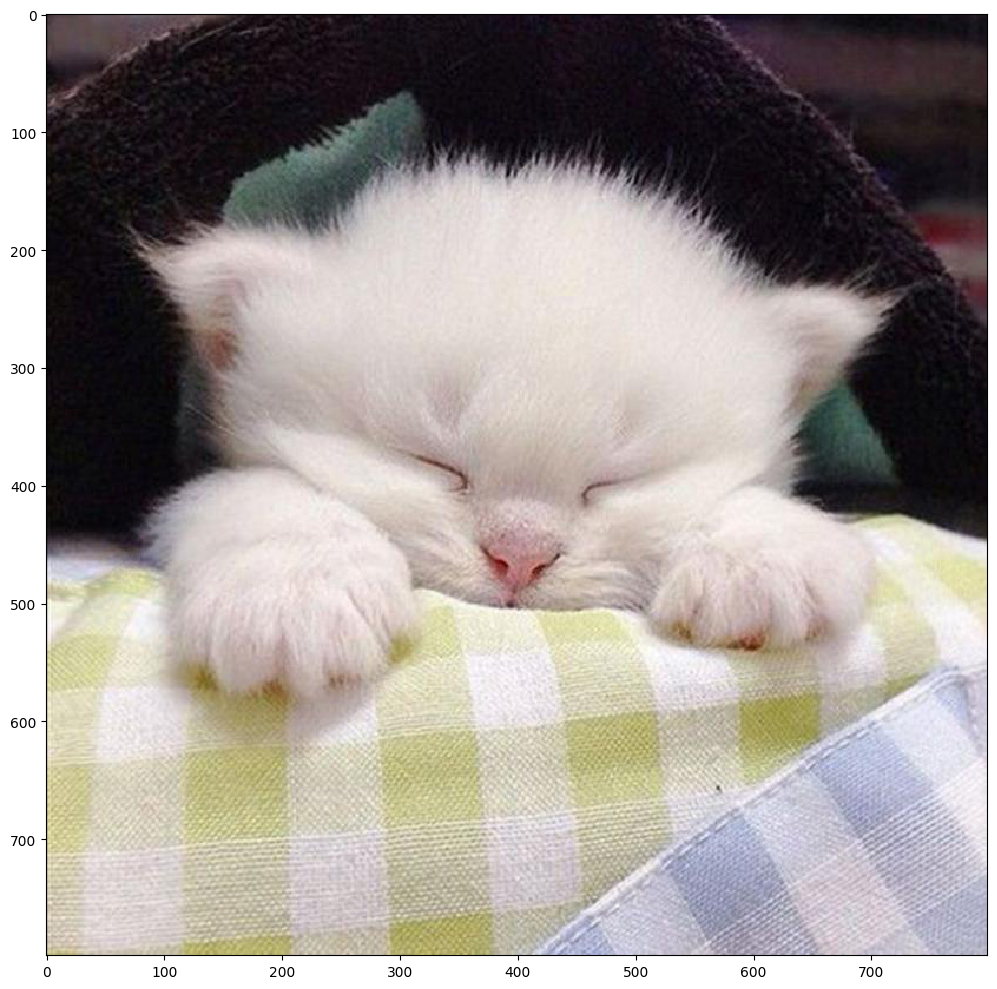

In [226]:
img = imread("drive/My Drive/Colab Notebooks/Cats/Cat_2.jpg")
imshow(img)

### 2 clusters

EM


CPU times: user 53 s, sys: 21.3 s, total: 1min 14s
Wall time: 45.7 s


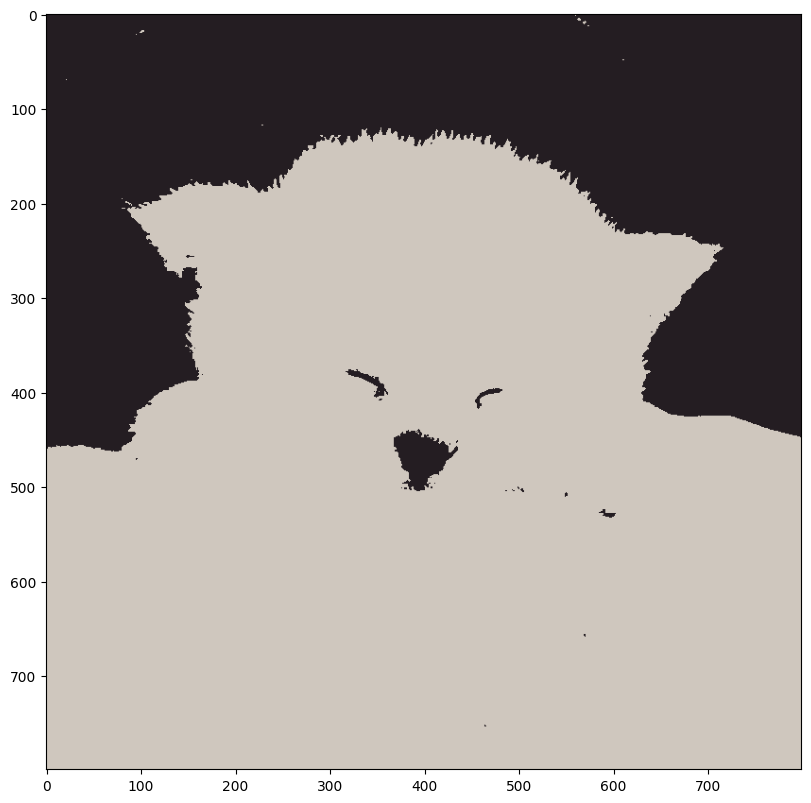

In [231]:
%%time
plt.imshow(EMSegmentation(img, 2))

K-means

CPU times: user 1.96 s, sys: 1.19 s, total: 3.15 s
Wall time: 1.82 s


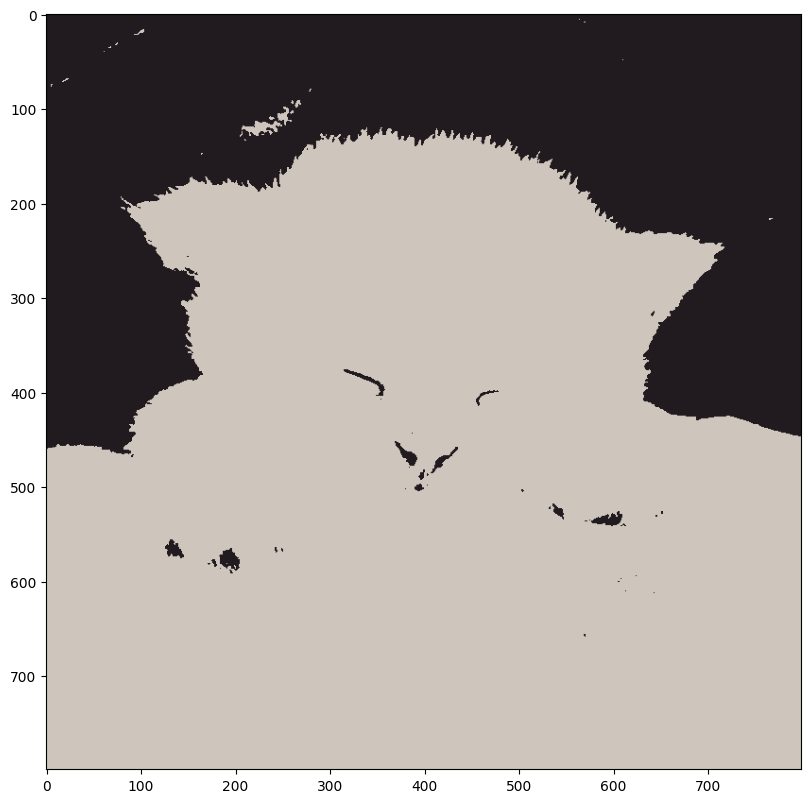

In [233]:
%%time
plt.imshow(KmeansSegmentation(img, 2))

### 4 clusters

EM


CPU times: user 2min 50s, sys: 1min 10s, total: 4min
Wall time: 2min 26s


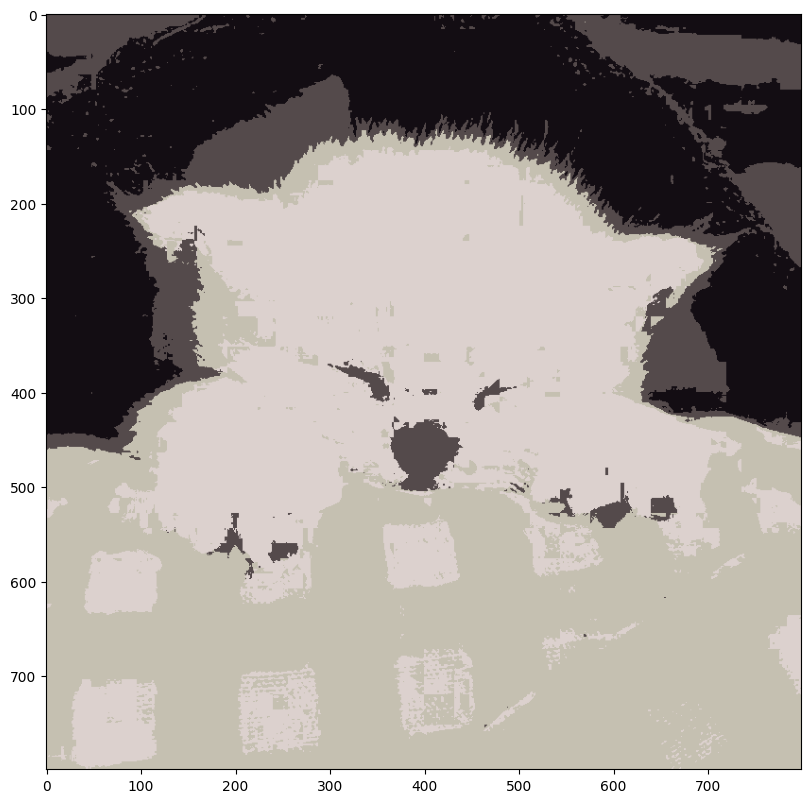

In [227]:
%%time
plt.imshow(EMSegmentation(img, 4))

K-means

CPU times: user 6.95 s, sys: 1.68 s, total: 8.62 s
Wall time: 6.7 s


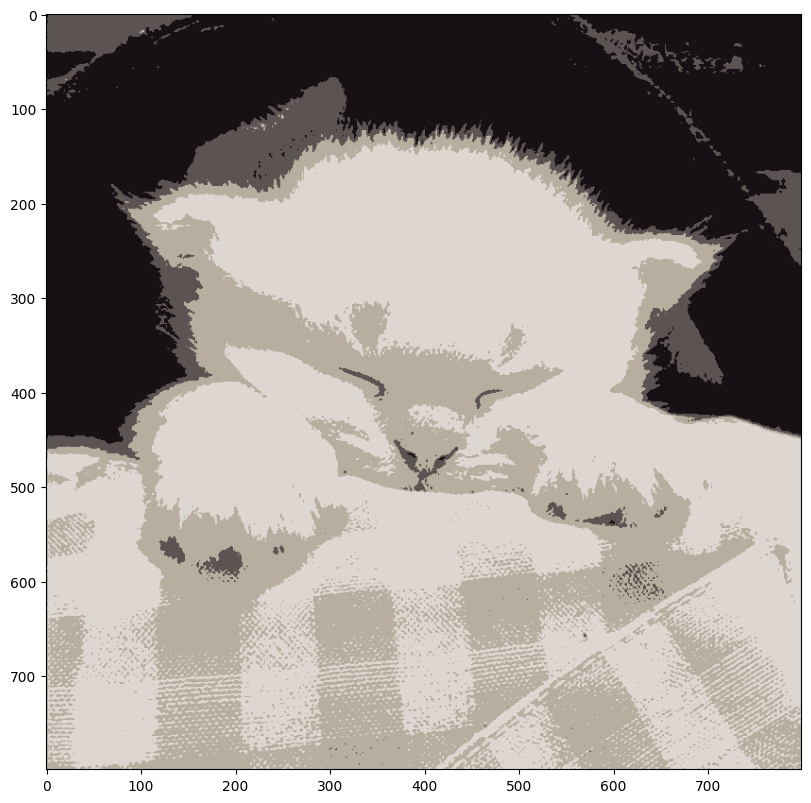

In [228]:
%%time
plt.imshow(KmeansSegmentation(img, 4))

We can see that EM really performs segmentation, while K-means tries to keep the picture as close to the original as possible.